# Введение

Данные интерактивные тетради основаны на языке Python.

Для выполнения кода выберите ячейку с кодом и нажмите `Ctrl + Enter`.

In [11]:
from platform import python_version
print("Используемая версия Python:", python_version())

Используемая версия Python: 3.7.8


Ячейки подразумевают последовательное исполнение.

In [12]:
l = [1, 2, 3]

In [13]:
l[0]

1

In [14]:
type(l)

list

In [15]:
help(l)

Help on list object:

class list(object)
 |  list(iterable=(), /)
 |  
 |  Built-in mutable sequence.
 |  
 |  If no argument is given, the constructor creates a new empty list.
 |  The argument must be an iterable if specified.
 |  
 |  Methods defined here:
 |  
 |  __add__(self, value, /)
 |      Return self+value.
 |  
 |  __contains__(self, key, /)
 |      Return key in self.
 |  
 |  __delitem__(self, key, /)
 |      Delete self[key].
 |  
 |  __eq__(self, value, /)
 |      Return self==value.
 |  
 |  __ge__(self, value, /)
 |      Return self>=value.
 |  
 |  __getattribute__(self, name, /)
 |      Return getattr(self, name).
 |  
 |  __getitem__(...)
 |      x.__getitem__(y) <==> x[y]
 |  
 |  __gt__(self, value, /)
 |      Return self>value.
 |  
 |  __iadd__(self, value, /)
 |      Implement self+=value.
 |  
 |  __imul__(self, value, /)
 |      Implement self*=value.
 |  
 |  __init__(self, /, *args, **kwargs)
 |      Initialize self.  See help(type(self)) for accurate sign

## Математический аппарат

В этих интерактивных тетрадях используется математический аппарат, основанный на парах вектор-кватернион.

Вектор (`Vector`) представлен тремя чиселами, кватернион (`Quaternion`) - четыремя.
Пара вектор-кватернион (`Transformation`) соостоит из вектора и кватерниона и описывает последовательные перемещение и поворот.
$$ T = 
\begin{bmatrix}
    [v_x, v_y, v_z] \\
    [q_w, q_x, q_y, q_z]
\end{bmatrix}
$$

Математический аппарат расположен в файле [kinematics.py](../edit/kinematics.py)

### Vector

Вектор - тройка чисел, описывает перемещение:
$$ v = [v_x, v_y, v_z] $$

In [17]:
from kinematics import Vector

Создание вектора требует трех чисел:

In [19]:
v1 = Vector(1, 2, 3)
v2 = Vector(-2, 4, -3)

Вектора можно складывать поэлементно:

In [22]:
v1 + v2

Vector[-1, 6, 0]

А также умножать на скаляр:

In [23]:
2.5 * v1

Vector[2.5, 5.0, 7.5]

Нулевой вектор создается через `Vector.zero()`:

In [24]:
Vector.zero()

Vector[0, 0, 0]

### Quaternion

Кватернион - четверка чисел, описывает поворот:
$$ q = [q_w, q_x, q_y, q_z] $$

In [25]:
from kinematics import Quaternion
from numpy import pi

Кватернион создается из угла и оси поворота:

In [27]:
q1 = Quaternion.from_angle_axis(0.5 * pi, Vector(0, 0, 1))
q2 = Quaternion.from_angle_axis(0.5 * pi, Vector(1, 0, 0))
print(q1)
print(q2)

[0.7071067811865476, 0.0, 0.0, 0.7071067811865475]
[0.7071067811865476, 0.7071067811865475, 0.0, 0.0]


Перемножение кватернионов соответствует последовательному приложению поворотов, в данном случае - повороту вокруг оси, проходящей через точку `(1, 1, 1)` на угол 120 градусов:

In [28]:
q1 * q2

Quaternion[0.5000000000000001, 0.5, 0.4999999999999999, 0.5]

In [29]:
Quaternion.from_angle_axis(2 / 3 * pi, Vector(1, 1, 1).normalized())

Quaternion[0.5000000000000001, 0.5, 0.5, 0.5]

Поворот вектора сокращен до оператора `*`:

In [30]:
q = Quaternion.from_angle_axis(pi / 2, Vector(0, 0, 1))
q * Vector(1, 2, 3)

Vector[-2.0, 1.0000000000000004, 3.0]

Кватернион нулевого поворота создается `Quaternion.identity()`:

In [31]:
Quaternion.identity() * Vector(1, 2, 3)

Vector[1, 2, 3]

### Transform

In [32]:
from kinematics import Transform

Пара вектор-кватернион собирается из вектора и кватерниона:

In [33]:
t1 = Transform(v1, q1)
t2 = Transform(v2, q2)

Пара состоит из смещения и поворота:

In [34]:
t1.translation

Vector[1, 2, 3]

In [35]:
t1.rotation

Quaternion[0.7071067811865476, 0.0, 0.0, 0.7071067811865475]

Пара с нулевыми смещением и поворотом создается через `Transform.identity()`:

In [36]:
Transform.identity()

Transform[
	[0, 0, 0]
	[1, 0, 0, 0]
]

Суммирование двух пар описывет последовательное применение смещения - поворота - смещения - поворота:

In [37]:
t1 + t2

Transform[
	[-3.0, 6.661338147750939e-16, 0.0]
	[0.5000000000000001, 0.5, 0.4999999999999999, 0.5]
]

Суммирование пары и ветора описывает применение преобразования, записанного в паре к вектору:

In [38]:
t1 + Vector(1, 0, 0)

Vector[1.0000000000000002, 3.0, 3.0]

## Графика

Подключим магию для работы с графикой:

In [39]:
from matplotlib import pyplot as plt
from matplotlib import animation
import numpy as np
from IPython.display import HTML
import graphics
%matplotlib notebook

Отрисовка систем координат производится через `graphics.axis`.
Преобразование цепочки в отдельные массивы точек `X, Y, Z` производится через `graphics.chain_to_points`.

<IPython.core.display.Javascript object>


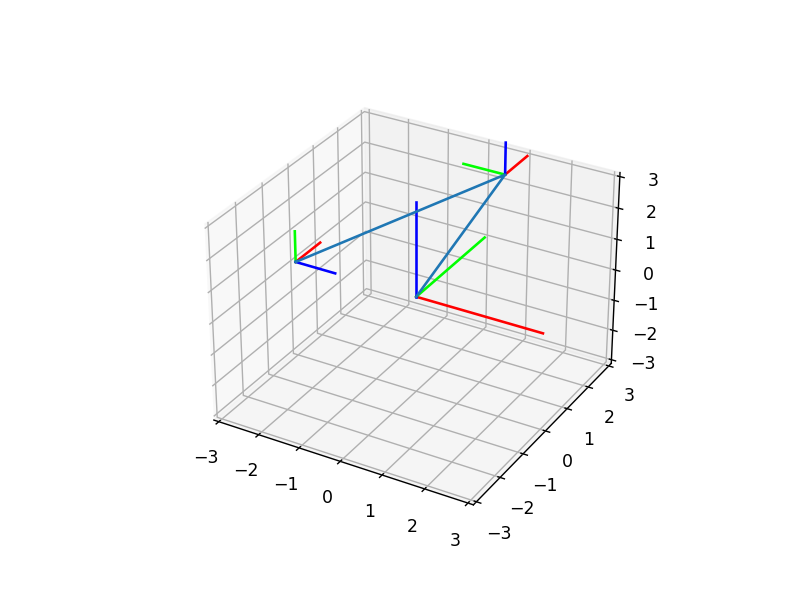

In [40]:
fig = plt.figure()
ax = fig.add_subplot(projection="3d")
ax.set_xlim([-3, 3]); ax.set_ylim([-3, 3]); ax.set_zlim([-3, 3]);
graphics.axis(ax, Transform.identity(), 3)
graphics.axis(ax, t1)
graphics.axis(ax, t1 + t2)
x, y, z = graphics.chain_to_points([Transform.identity(), t1, t1 + t2])
ax.plot(x, y, z)
fig.show()

## Анимация

Анимация будет сохраняться в переменную, например в `ani`, которую потом можно будет отобразить в виде видеоролика через `HTML(ani.to_jshtml())`.
Перед сохранением в виде ролика можно заранее повернуть сцену мышкой.
Обратите внимание что перерисовка каждого кадра требует работы ядра.
Для остановки нажмите кнопку выключения в правом верхнем углу трехмерной сцены.

<IPython.core.display.Javascript object>


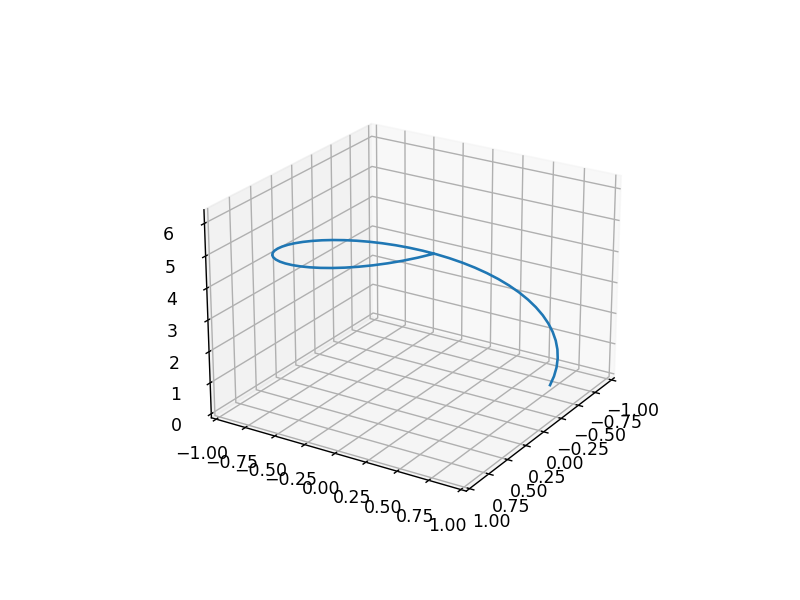

In [41]:
fig = plt.figure()
ax = fig.add_subplot(projection="3d")
ax.set_xlim([-1, 1]); ax.set_ylim([-1, 1]); ax.set_zlim([0, 2 * pi])
l, = ax.plot([], [], [])
t = np.arange(1, 2 * pi, 0.1)
frames = 100
def animate(i):
    offs = i / frames * 2 * pi
    z = t
    q = Quaternion.from_angle_axis(t + offs, Vector(0, 0, 1))
    v = q * Vector(1, 0, 0)
    x = v.x
    y = v.y
    l.set_data_3d(x, y, z)
ani = animation.FuncAnimation(
    fig,
    animate,
    frames=frames,
    interval=100
)

Не забудьте выключить пересчет модели кнопкой в правом верхнем углу трехмерной сцены.

In [42]:
HTML(ani.to_jshtml())

Полученый таким образом ролик можно сохранить в составе всей тетради и выкачать локальную копию через `File -> Download as -> Notebook (.ipynb)`.

## Символьные вычисления

Для работы с символьными вычислениями используется пакет `sympy`.

In [43]:
import sympy as sp

In [44]:
x = sp.symbols("x")
x

x

`sympy` позволяет описывать деревья вычислений:

In [45]:
v = sp.sin(x) ** 2 + sp.cos(x) ** 2
v

sin(x)**2 + cos(x)**2

И упрощать их:

In [46]:
sp.simplify(v)

1

In [47]:
u = sp.cos(x) ** 2 - sp.sin(x) ** 2
u

-sin(x)**2 + cos(x)**2

In [48]:
sp.simplify(u)

cos(2*x)

Можно легко дифференцировать выражения:

In [49]:
t = sp.symbols("t")
f = sp.sin(t + 2 * x ** 2)
f

sin(t + 2*x**2)

Производная по $t$:

In [50]:
sp.diff(f, t)

cos(t + 2*x**2)

Производная по $x$:

In [51]:
sp.diff(f, x)

4*x*cos(t + 2*x**2)

Для того, чтобы описать кватернион в системе `sympy`, нужно передать `sympy`(`sp`) как последний агрумент в `Quaternion.from_angle_axis`:

In [52]:
a, b, c = sp.symbols("a, b, c")
angle = sp.symbols("alpha")
q = Quaternion.from_angle_axis(angle, Vector(0, 0, 1), sp)
v = Vector(a, b, c)
rotated = q * v

In [53]:
sp.simplify(rotated.x)

-2*a*sin(alpha/2)**2 + a - b*sin(alpha)

In [54]:
sp.simplify(rotated.y)

a*sin(alpha) - 2*b*sin(alpha/2)**2 + b

In [55]:
sp.simplify(rotated.z)

c

А еще можно решать уравнения:

In [56]:
alpha, beta = sp.symbols("alpha, beta")
t0 = Transform(
    Vector.zero(),
    Quaternion.from_angle_axis(alpha, Vector(0, 0, 1), sp)
)
t1 = t0 + Transform(
    Vector(beta, 0, 0),
    Quaternion.identity()
)

In [57]:
target_x = t1.translation.x
target_x

-beta*sin(alpha/2)**2 + beta*cos(alpha/2)**2

In [58]:
target_y = t1.translation.y
target_y

2*beta*sin(alpha/2)*cos(alpha/2)

In [59]:
x, y = sp.symbols("x, y")
solution = sp.solve(
    [
        sp.simplify(target_x) - x,
        sp.simplify(target_y) - y
    ],
    [
        alpha,
        beta
    ]
)

Первое решение для $\alpha$:

In [60]:
solution[0][0]

asin(y/sqrt(x**2 + y**2)) + pi

Первое решение для $\beta$:

In [61]:
solution[0][1]

-sqrt(x**2 + y**2)

Действительно, если подставить решение, в, например, $y$, получим следущее:

In [62]:
sp.simplify(
    t1.translation.y.replace(alpha, solution[0][0]).replace(beta, solution[0][1])
)

y

Для $x$ такой красоты (пока) не произойдет, придется упрощать вручную:

In [63]:
sp.simplify(
    t1.translation.x.replace(alpha, solution[0][0]).replace(beta, solution[0][1])
)

sqrt(x**2 + y**2)*sqrt(-y**2/(x**2 + y**2) + 1)

Возможно стоит использовать свое собственное решение, например:
$$ \alpha = \tan^{-1}(y, x) $$
$$ \beta = \sqrt{x^2 + y^2} $$

In [64]:
own_alpha = sp.atan2(y, x)
own_beta = sp.sqrt(x ** 2 + y ** 2)

In [65]:
sp.simplify(t1.translation.x.replace(alpha, own_alpha).replace(beta, own_beta))

x

In [66]:
sp.simplify(t1.translation.y.replace(alpha, own_alpha).replace(beta, own_beta))

y